In [1]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mping

%matplotlib inline

In [2]:
# menyimpan gambar dengan fungsi imread dari OpenCV
img = cv2.imread("prambanan.jpg")  
# sesuaikan dengan nama file yang diunggah pada cell sebelumnya

# lihat tipe data img. disimpan sebagai apa?
print(type(img))

<class 'numpy.ndarray'>


## Image Filtering

### Konsep Filtering

Image Filtering (atau *convolution*) merupakan salah satu teknik pengolahan citra yang banyak digunakan. Filtering menggunakan prinsip pengolahan citra sederhana dimana setiap band pada sebuah citra dianggap sebagai sebuah matriks. Selanjutnya, operasi matematika dilakukan pada matriks tersebut untuk memperoleh atau menguatkan fitur tertentu yang ada pada citra tersebut. Operasi Image Filtering sering digunakan sebagai langkah awal dalam pengolahan (pre-processing) citra, misalnya untuk menghilangkan noise atau memperkuat fitur dengan ciri tertentu pada citra.

Image Filtering bekerja dengan cara menjalankan sebuah *'kernel'* atau matriks persegi dengan ukuran tertentu pada seluruh citra secara bertahap. Inilah mengapa operasi kernel pada seringkali disebut sebagai *'moving window'*. 
![](https://miro.medium.com/max/2340/1*Fw-ehcNBR9byHtho-Rxbtw.gif)

Dengan perkembangan pada bidang Deep Learning, Convolution menjadi salah satu teknik penting yang digunakan untuk mengekstraksi fitur level rendah dari sebuah gambar. Karenanya, memahami konsep ini diperlukan untuk memahami bagaimana cara Deep Learning bekerja, khususnya pada metode seperti Convolution Neural Network (CNN).

### Melakukan Operasi Image Filtering dengan OpenCV


**1. Low-Pass Filtering**

OpenCV memiliki [berbagai operasi](https://docs.opencv.org/master/d4/d13/tutorial_py_filtering.html) yang dapat digunakan untuk proses filtering, diantaranya: Averaging, Gaussian, Median filter dan Billateral filtering. Pada bagian ini akan dilakukan beberapa percobaan menggunakan fungsi-fungsi OpenCV untuk melakukan Image Filtering. Gunakan data yang diberikan sebagai latihan, atau gunakan gambar yang dapat Anda temukan dari internet.

Sebagai latihan pertama, akan dilakukan filtering pada gambar `prambanan.jpg` dengan menggunakan kernel berupa matriks berukuran [5x5] sebagai berikut:

K = 
$\frac {1}{25} \begin{bmatrix} 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \\ 1 & 1 & 1 & 1 & 1 \end{bmatrix}$

[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


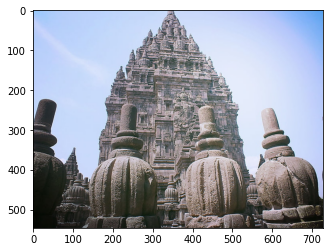

In [3]:
#rgb
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# tampilkan gambar awal tanpa filter
plt.imshow(img2)


# membuat filter: matriks berukuran 5 x 5 
kernel = np.ones((5,5),np.float32)/25
print(kernel)

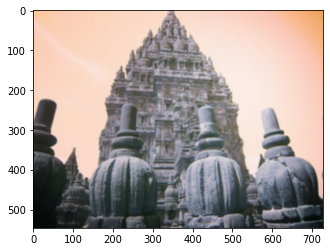

In [4]:
# lakukan filtering
filter = cv2.filter2D(img,-1,kernel)

plt.imshow(filter)

# salt and pepper

Selain menggunakan `imshow` seperti di atas, kita juga dapat menggunakan modul Matplotlib, seperti berikut:

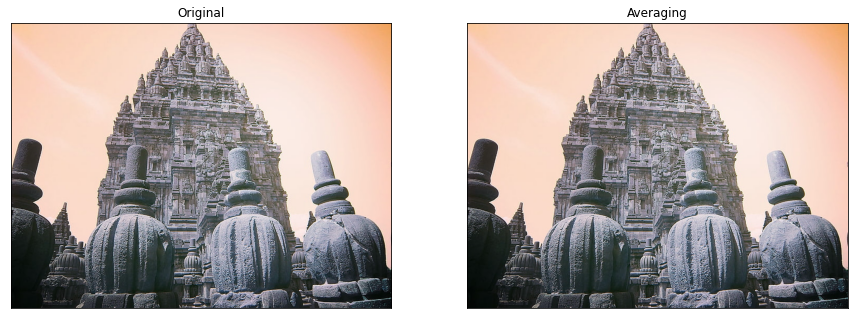

In [5]:
# perbesar ukuran hasil plotting jika diperlukan
plt.rcParams["figure.figsize"] = (15,15)

# plot pertama, gambar asli
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])

# kedua, hasil filter
plt.subplot(122),plt.imshow(img),
plt.title('Averaging')
plt.xticks([]), plt.yticks([])

# Plot!
plt.show()

Pada script di atas, kernel dibuat dengan menggunakan fungsi numpy (np.ones) dan moving window diterapkan dengan fungsi opencv (filter2D). Kedua fungsi tersebut dapat diganti dengan menggunakan perintah `cv2.blur`.

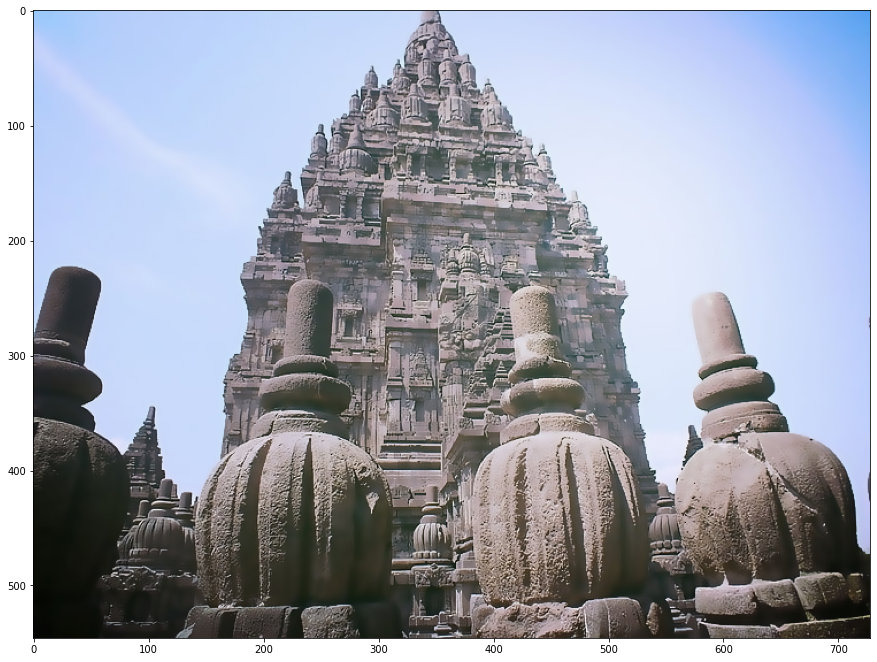

In [6]:
orange_blur = cv2.bilateralFilter(img2,9,75,75)
plt.imshow(orange_blur)

Sekarang, mencoba merubah kernelnya

[[0.04 0.04 0.04]
 [0.04 0.08 0.04]
 [0.04 0.04 0.04]]


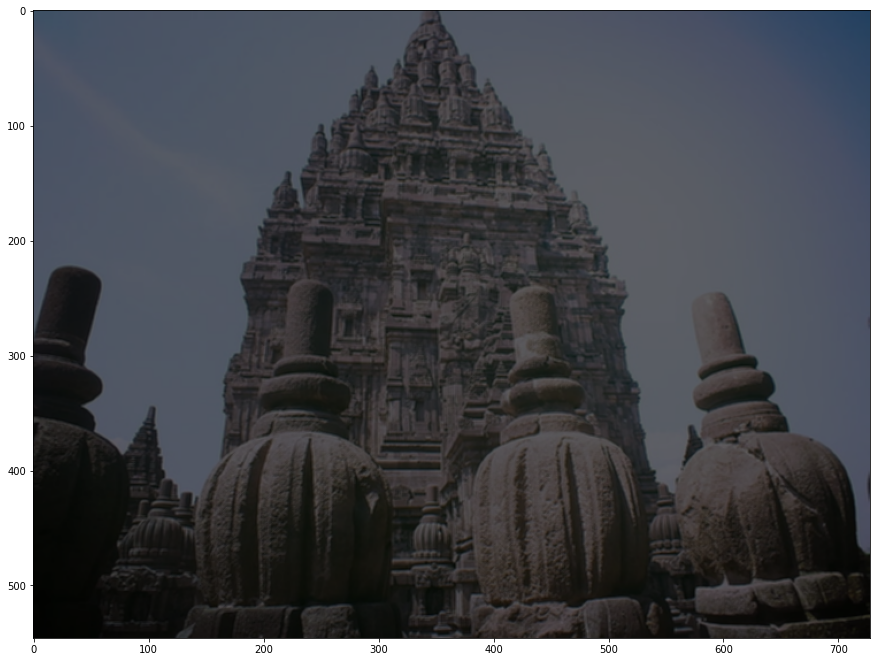

In [7]:
# ini adalah cara lain untuk membuat sebuah kernel, 
# yaitu dengan menggunakan np.matrix
# kali ini, ukuran matriksnya 3 x 3
kernel = np.matrix([
          [1, 1, 1],
          [1, 2, 1],
          [1, 1, 1]         
          ])/25
print(kernel)

# buat lagi filteringnya
orange_filter = cv2.filter2D(img2,-1,kernel)

# tampilkan
plt.imshow(orange_filter)

**Averaging Filter**

Fungsi *low-pass filter* di atas menerapkan rerata pada nilai piksel yang dilewati oleh kernel, sehingga disebut dengan ’moving average’ atau ’averaging’. Terdapat beberapa jenis algoritma low-pass filtering lainnya yang dapat digunakan pada kasus yang berbeda, a.l.:

1.	Gaussian Filter:
`blur = cv2.GaussianBlur(img,(5,5),0)`

2.	Median filtering:
`median = cv2.medianBlur(img,5)`

3.	Billateral Filter:
`blur = cv2.bilateralFilter(img,9,75,75)`

**2. High-Pass Filtering**

Pada contoh *Averaging* di atas kita menggunakan kernel dalam bentuk matriks. Sejauh ini kita melakukan operasi citra dengan menganggap tiap band citra merupakan domain matriks yang terdiri dari baris dan kolom. Sejatinya, kita juga dapat merepresentasikan sebuah citra sebagai *fungsi matematika* yang tersusun dari beberapa parameter. Misalnya [seperti berikut](https://ai.stanford.edu/~syyeung/cvweb/tutorial1.html):

![](https://ai.stanford.edu/~syyeung/cvweb/Pictures1/function.png)

Dengan demikian, kita juga dapat menerapkan fungsi matematis tertentu pada domain citra tersebut sehingga kita dapat memperoleh citra baru hasil pengolahan. Filtering adalah salah satu operasi yang banyak dilakukan dengan metode ini.

![](https://ai.stanford.edu/~syyeung/cvweb/Pictures1/processing.png)

Pada bagian berikut akan diberikan contoh operasi High-pass filtering yang sering digunakan untuk mempertegas tepian sebuah objek pada citra menggunakan operator Sobel dan Laplacian. Berikut adalah contoh operator Sobel:

![](https://homepages.inf.ed.ac.uk/rbf/HIPR2/figs/sobmasks.gif)





Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


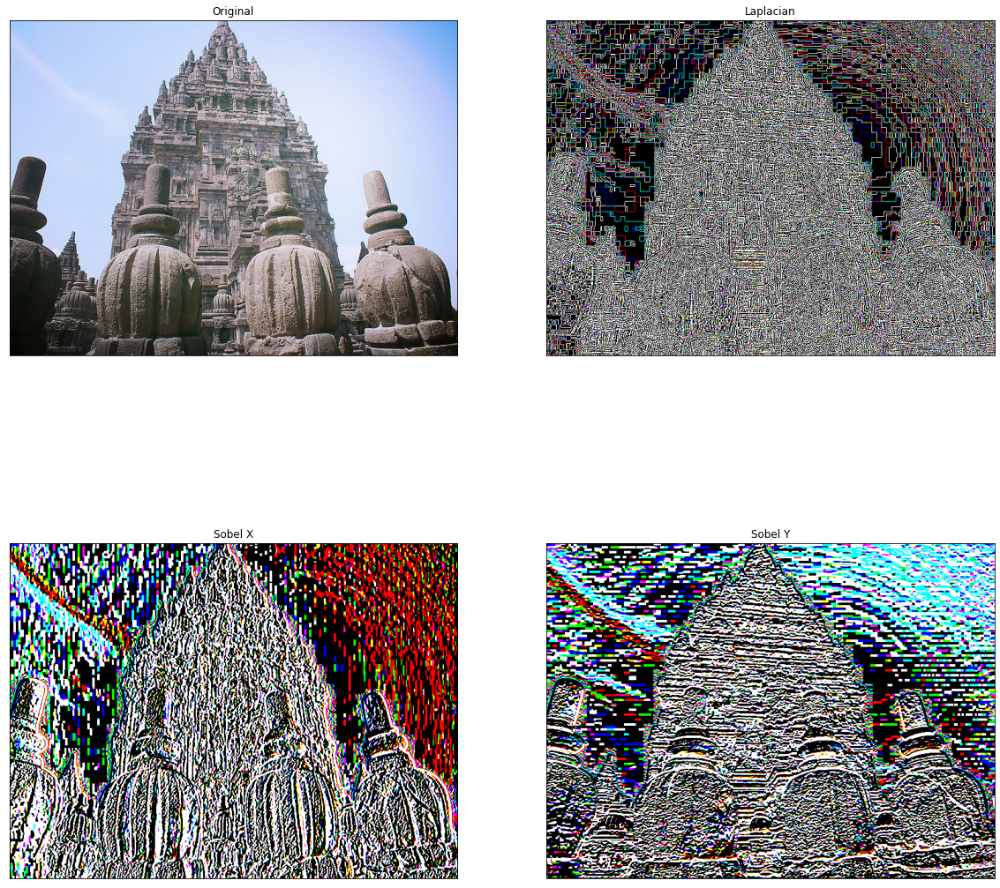

In [8]:
# Highpass Filter

# sebenarnya kita tidak perlu melakukan filtering lagi. Cukup sekali saja 
# di bagian awal, selama notebook ini tetap terhubung
import cv2
import numpy as np
from matplotlib import pyplot as plt

# menerapkan algoritma high-pass filtering:
# laplacian
laplacian = cv2.Laplacian(img,cv2.CV_64F)


# sobel dengan ukuran kernel 5
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

# Catatan:
# CV_64F pada contoh di atas menunjukkan nilai bit dari citra 
# yang dihasilkan serta tipe datanya (F = Float)

# perbesar ukuran hasil plotting 
plt.rcParams["figure.figsize"] = (20,20)


# menampilkan hasil filter
plt.subplot(2,2,1),plt.imshow(img2,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])
plt.show()




Fungsi di atas menerapkan algoritma dasar high-pass filtering dengan ukuran kernel berupa matriks 5x5. Hasil yang diperoleh merupakan penguatan dari informasi tepi (edge) yang ada pada citra.

OpenCV juga menyediakan algoritma yang khusus digunakan dalam ekstraksi tepi. Diantaranya adalah Canny Edges. Sebagai praktik, gunakan script berikut:

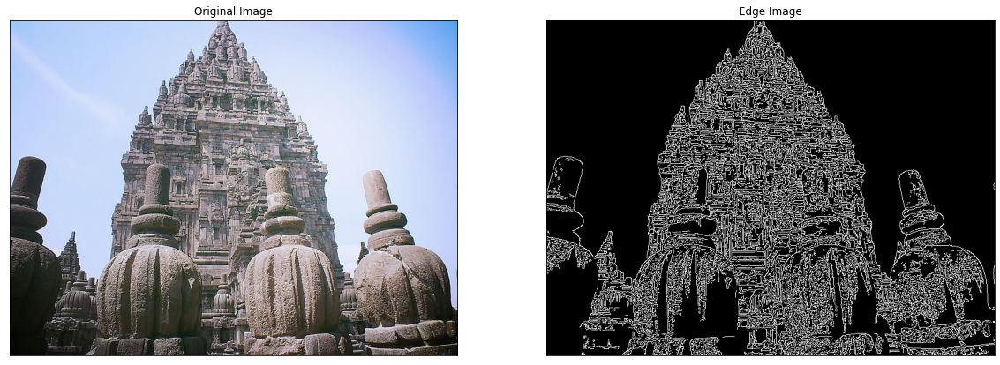

In [9]:
# memanggil fungsi Canny Edges dengan argument (citra, nilai_min, nilai_max)
edges = cv2.Canny(img,100,200)

plt.subplot(121),plt.imshow(img2,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()


Dengan merubah nilai parameter minimum dan maksimum pada perintah cv2.Canny, akan diperoleh lebih banyak atau lebih sedikit detil tergantung pada parameter yang digunakan.

## Image Thresholding



### Konsep Thresholding

Thresholding merupakan metode yang digunakan untuk melakukan ekstraksi objek dengan memanipulasi nilai digital number yang melewati batas ambang (‘threshold’) tertentu. Sebuah fungsi kemudian menentukan apa yang terjadi pada nilai piksel yang melewati batas ambang tersebut. 


![](https://ai.stanford.edu/~syyeung/cvweb/Pictures1/lena_segmentation.png)

Sebagaimana Filtering, Thresholding juga sering digunakan sebagai perantara pada berbagai pengolahan citra untuk mendapatkan objek yang digambarkan pada citra tersebut. Thresholding merupakan salah satu metode *segmentation* yang paling sering digunakan.

### Thresholding

OpenCV memiliki beberapa fungsi untuk [Thresholding](https://docs.opencv.org/master/d7/d4d/tutorial_py_thresholding.html). Binary Thresholding barangkali adalah yang paling sederhana dan banyak digunakan untuk memisahkan antara objek dengan gambar latar. Berikut adalah contoh bagaimana melakukan thresholding dengan OpenCV

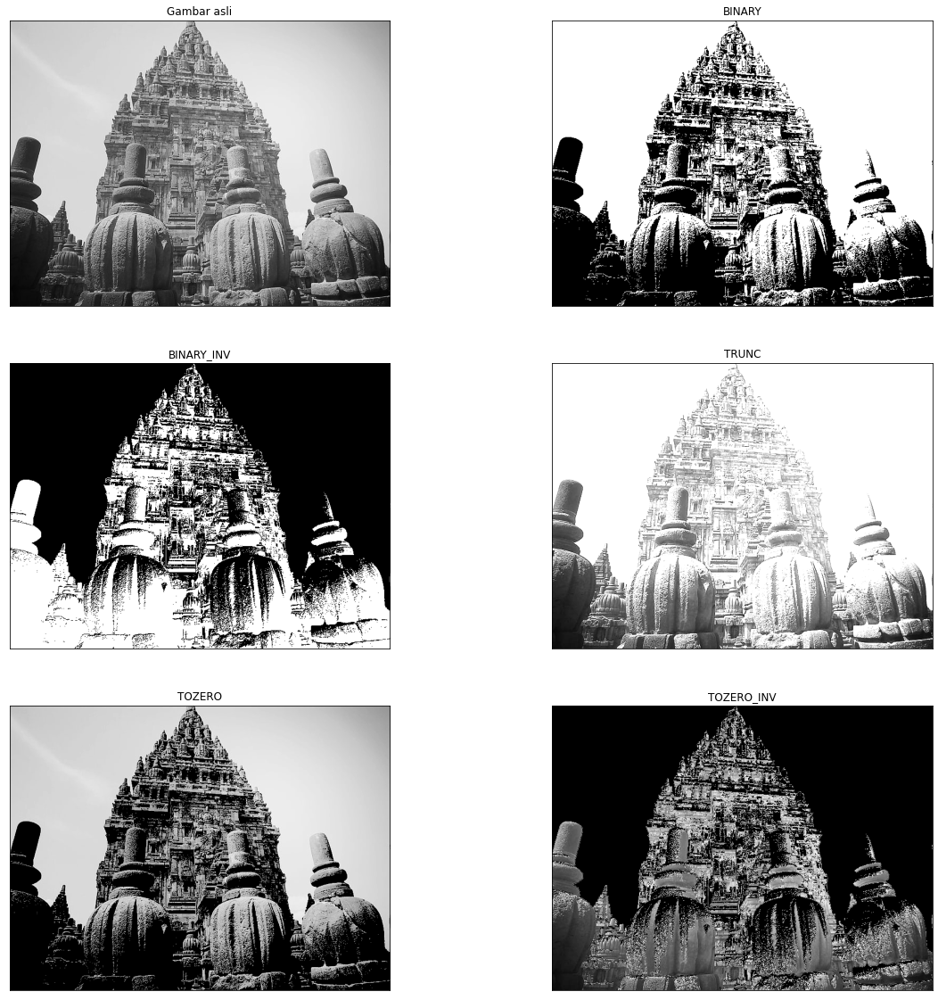

In [10]:
# membaca gambar baymax 
img = cv2.imread('prambanan.jpg',0)

# Hitungan threshold. 
# Perhatikan nilai ambang batas bawah dan atas dari tiap fungsi 
# yang diberikan
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)

# menampilkan hasil
titles = ['Gambar asli','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

# menampilkan beberapa gambar sekaligus
for i in range(6):
    # 3 baris, 2 kolom
    plt.subplot(3,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()


Adaptif Treshold

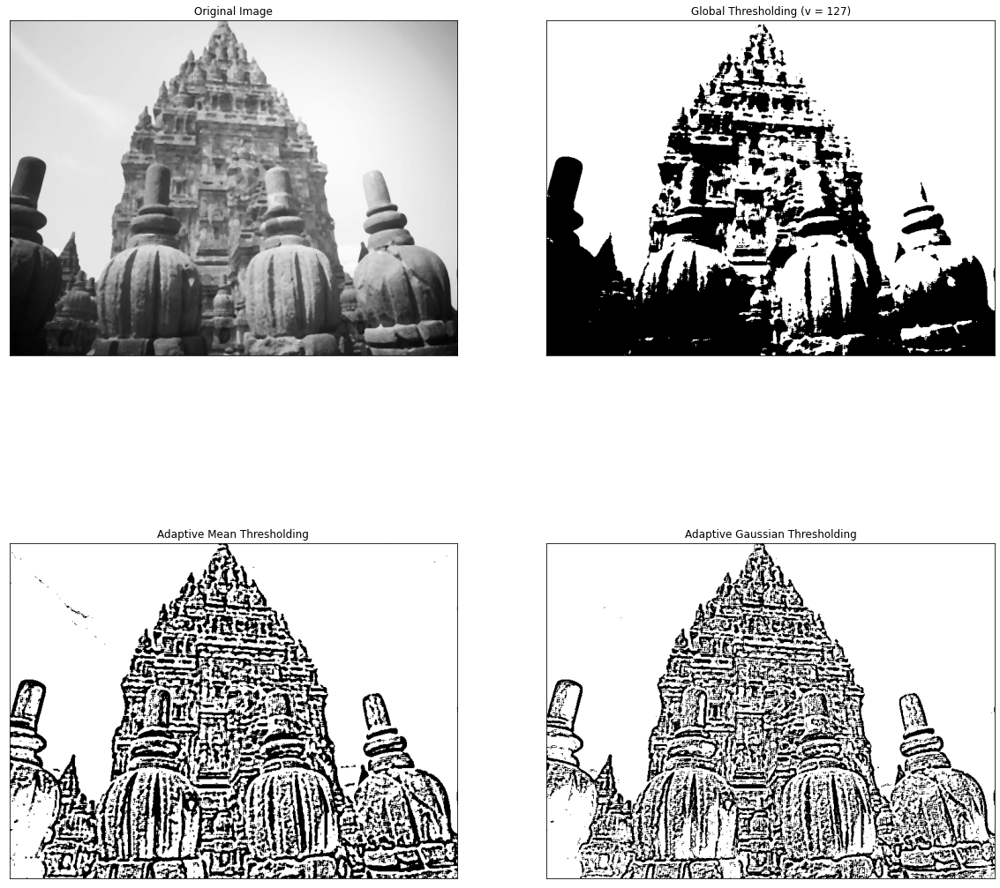

In [11]:
# masih menggunakan variabel img yang sama
#img = cv2.imread('images/baymax.jpg',0)

# digunakan median blur untuk menghaluskan tepi objek pada citra
# ini diperlukan agar thresholding memberikan hasil lebih baik
img = cv2.medianBlur(img,5)

# Lakukan Thresholding
# Binary Threshold
ret,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

# Adaptive Threshold dengan Mean
th2 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,11,2)

# Adaptive Threshold dengan Gaussian
th3 = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,11,2)


# Plotting
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]

# menampilkan hasil
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()


Otsu, metode Thresholding yang sering digunakan dalam ekstraksi garis pantai. [Algoritma Otsu](http://www.labbookpages.co.uk/software/imgProc/otsuThreshold.html) berbeda dengan metode Thresholding lainnya di atas. Otsu menggunakan beberapa bobot sebagai parameter dalam penentuan thresholding, sehingga dapat mengolah gambar dengan nilai piksel yang lebih beragam. 

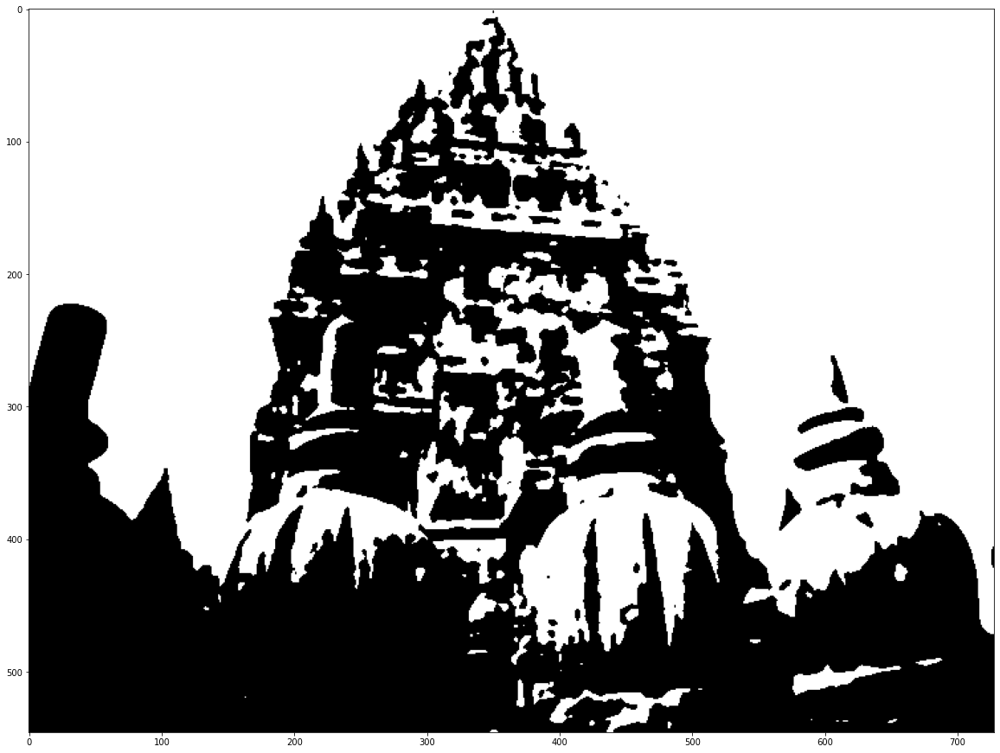

In [12]:
# Menerapkan Gaussian filtering sebelum Otsu’s thresholding
blur = cv2.GaussianBlur(img,(5,5),0)


# Otsu
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Plotting
plt.imshow(th3,'gray')
plt.show()


### Edge Detection

Deteksi tepi (*Edge Detection*) merupakan salah satu teknik yang digunakan untuk memperoleh informasi mengenai sebuah objek. Di atas telah kita bahas bahwa sebuah citra dapat dianggap memiliki domain matriks dan domain fungsi. 

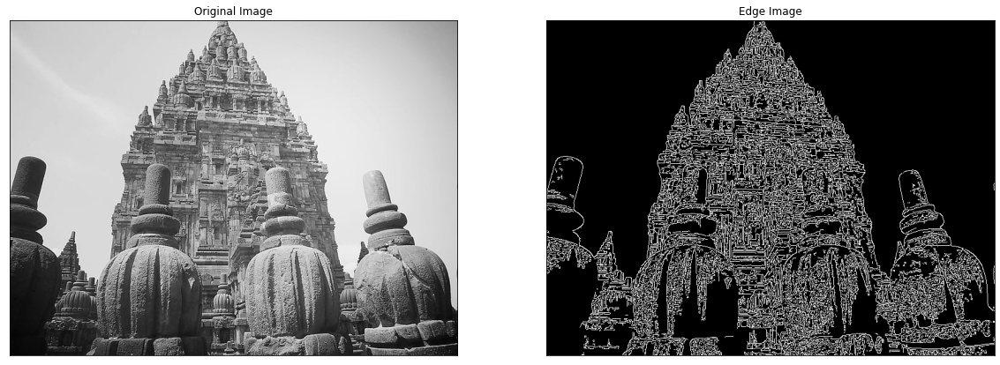

In [13]:
img = cv2.imread('prambanan.jpg',0)

# deteksi tepi dengan Canny Edge
edges = cv2.Canny(img,100,200)

plt.subplot(121),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

### Membuat 'Kontur' dari image

Dari hasil deteksi tepi pada Canny, kita dapat memperoleh garis tersebut dalam bentuk *kontur*. Kontur gambar ini dapat digunakan untuk berbagai keperluan, misalnya disimpan sebagai vector pada pengolahan selanjutnya, atau digunakan untuk menghitung jumlah objek yang terdapat pada citra. Algoritma kontur ini cukup sederhana, meskipun tidak akan dibahas pada bagian ini. Contoh berikut diberikan untuk memberikan gambaran bagaimana kontur pada sebuah Citra dibuat sebagai hasil dari deteksi tepi menggunakan Canny Edge.

Jumlah kontur yang berhasil dideteksi = 1098


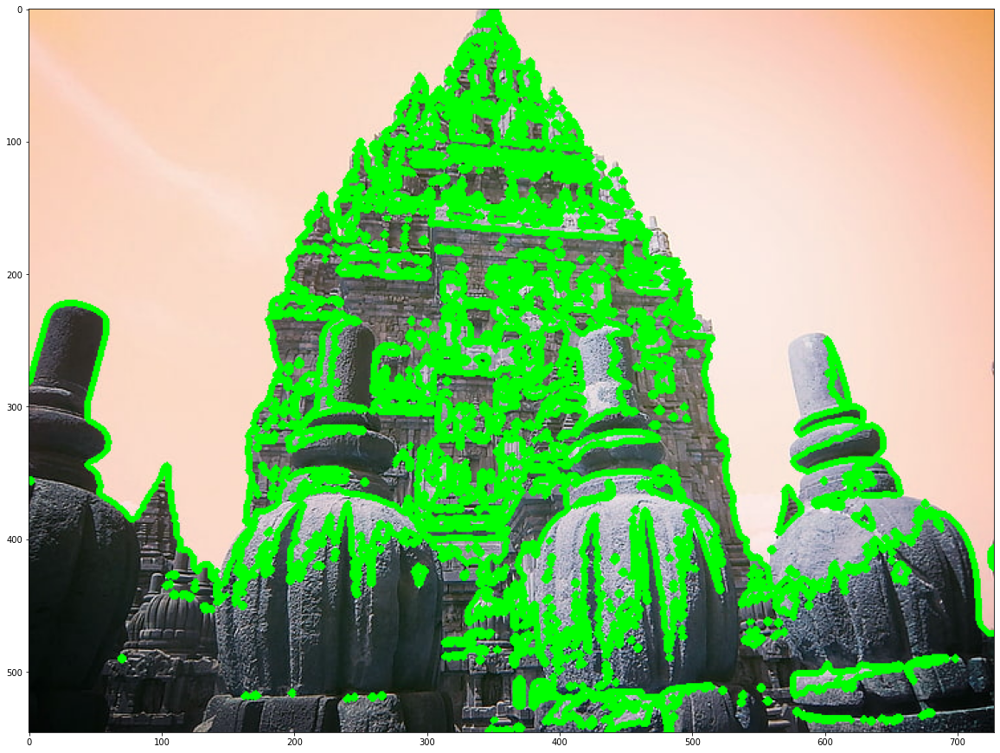

In [14]:
# gambar berwarna untuk diplot
img_ori = cv2.imread('prambanan.jpg')

# grayscale untuk diolah
img = cv2.imread('prambanan.jpg',0)

# Menerapkan Gaussian filtering sebelum Otsu’s thresholding
blur = cv2.GaussianBlur(img,(5,5),0)

# Otsu
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
 
# Menggunakan Canny Edge untuk deteksi tepi
edged = cv2.Canny(th3, 30, 200) 
  
# mencari kontur
contours, hierarchy = cv2.findContours(edged,  
    cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
  
plt.imshow(edged) 
  
print("Jumlah kontur yang berhasil dideteksi = " + str(len(contours))) 
  
# Gambar kontur yang dideteksi
# -1 artinya gambar semua kontur yang ditemukan
cv2.drawContours(img_ori, contours, -1, (0, 255, 0), 3) 
  
plt.imshow(img_ori) 


**Memilah Kontour**

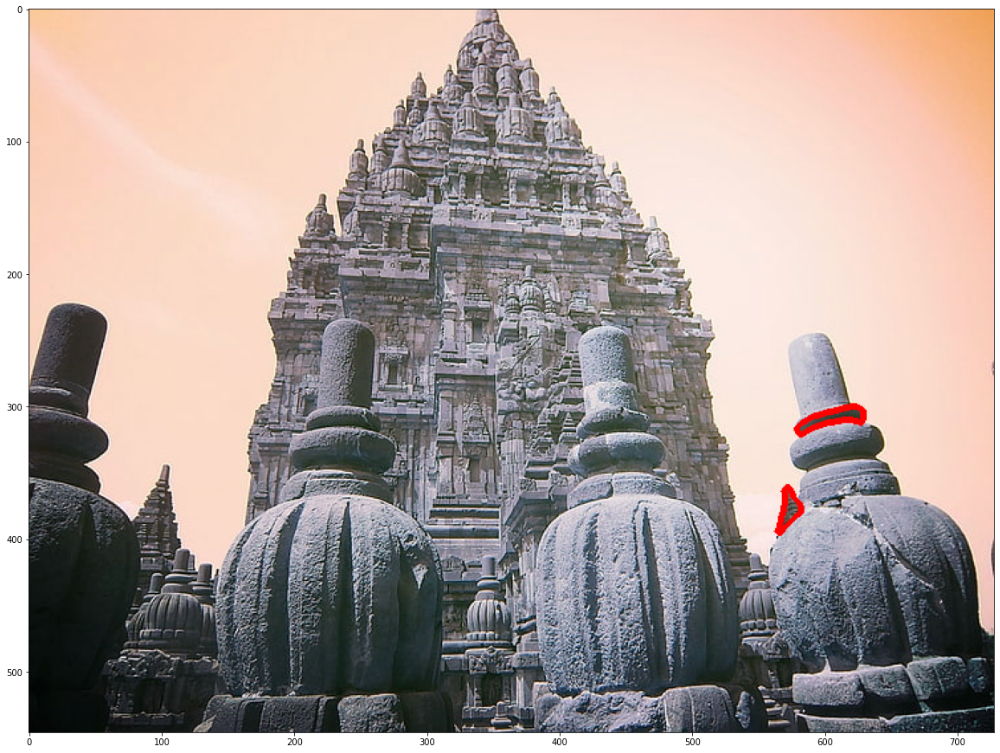

In [15]:
# baca lagi gambar baymax: variabel sebelumnya sudah tergambar kontur
img_ori = cv2.imread('prambanan.jpg')

# untuk tiap kontur yang dideteksi
for i,cnt in enumerate(contours):
  if cv2.contourArea(cnt) > 150:  
    # jika area kontur lebih dari 150 piksel, baru konturnya digambar
    cv2.drawContours(img_ori,[cnt], 0, (255), 3)  

# tampilkan gambar yang sudah diberi kontur tersebut
plt.imshow(img_ori) 
